In [2]:
import pandas as pd
import pymysql
from mysql.connector import Error


In [13]:
a = pd.read_csv('C:/Users/malli/Personal_Projects/Rapido_Bookings/Data_set/rides_data.csv')
a.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
0,cab economy,15-07-2024,30:40.5,completed,Balagere Harbor,Harohalli Nagar,39,RD3161218751875354,27.21,764.83,31.51,796.34,Amazon Pay
1,auto,05-07-2024,36:51.5,completed,Basavanagudi 3rd Block,Bikasipura 1st Stage,89,RD8171514284594096,34.03,314.83,49.52,364.35,Paytm
2,auto,23-07-2024,05:37.5,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NaN,NaN,NaN,NaN
3,cab economy,24-06-2024,45:10.5,completed,Mahadevapura Mews,Kanakapura Arc,89,RD3676889143182765,31.17,484.73,15.84,500.57,QR scan
4,cab economy,15-07-2024,26:44.5,completed,Ganganagar Cove,Basaveshwaranagar Colony,95,RD6639410275948084,27.21,663.50,14.13,677.63,Amazon Pay


In [47]:
a.where(pd.notna(a), None)

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
0,cab economy,2024-07-15,08:30:40.542646,completed,Balagere Harbor,Harohalli Nagar,39,RD3161218751875354,27.21,764.83,31.51,796.34,Amazon Pay
1,auto,2024-07-05,23:36:51.542646,completed,Basavanagudi 3rd Block,Bikasipura 1st Stage,89,RD8171514284594096,34.03,314.83,49.52,364.35,Paytm
2,auto,2024-07-23,11:05:37.542646,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NaN,NaN,NaN,None
3,cab economy,2024-06-24,08:45:10.542646,completed,Mahadevapura Mews,Kanakapura Arc,89,RD3676889143182765,31.17,484.73,15.84,500.57,QR scan
4,cab economy,2024-07-15,00:26:44.542646,completed,Ganganagar Cove,Basaveshwaranagar Colony,95,RD6639410275948084,27.21,663.50,14.13,677.63,Amazon Pay
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,cab economy,2024-07-24,10:12:37.811393,completed,Giri Nagar Quarters,Lingarajapuram Village,79,RD1742789687725650,7.03,518.90,23.81,542.71,Amazon Pay
49996,auto,2024-08-12,11:24:08.811393,completed,Hennur Road District,Hulimavu Pier,39,RD3524793949448023,31.77,977.34,2.67,980.01,Paytm
49997,bike,2024-08-10,21:52:48.811393,completed,Agara Heights,Ulsoor 4th Block,40,RD6755775741450371,25.74,331.94,38.32,370.26,Paytm
49998,auto,2024-07-07,20:44:00.811393,completed,Hosur Colony,Kanakapura Works,111,RD9198658614373790,11.70,565.47,0.33,565.80,Amazon Pay


In [48]:
a.isna().sum()

services             0
date                 0
time                 0
ride_status          0
source               0
destination          0
duration             0
ride_id              0
distance             0
ride_charge       5036
misc_charge       5036
total_fare        5036
payment_method    5036
dtype: int64

In [49]:
a['ride_charge'] = a['ride_charge'].where(pd.notna(a['ride_charge']), None)
a.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
0,cab economy,2024-07-15,08:30:40.542646,completed,Balagere Harbor,Harohalli Nagar,39,RD3161218751875354,27.21,764.83,31.51,796.34,Amazon Pay
1,auto,2024-07-05,23:36:51.542646,completed,Basavanagudi 3rd Block,Bikasipura 1st Stage,89,RD8171514284594096,34.03,314.83,49.52,364.35,Paytm
2,auto,2024-07-23,11:05:37.542646,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NaN,NaN,NaN,NaN
3,cab economy,2024-06-24,08:45:10.542646,completed,Mahadevapura Mews,Kanakapura Arc,89,RD3676889143182765,31.17,484.73,15.84,500.57,QR scan
4,cab economy,2024-07-15,00:26:44.542646,completed,Ganganagar Cove,Basaveshwaranagar Colony,95,RD6639410275948084,27.21,663.50,14.13,677.63,Amazon Pay


In [51]:
(a==0).sum()

services          0
date              0
time              0
ride_status       0
source            0
destination       0
duration          0
ride_id           0
distance          0
ride_charge       0
misc_charge       8
total_fare        0
payment_method    0
dtype: int64

In [53]:
a.isna().sum()

services             0
date                 0
time                 0
ride_status          0
source               0
destination          0
duration             0
ride_id              0
distance             0
ride_charge       5036
misc_charge       5036
total_fare        5036
payment_method    5036
dtype: int64

In [55]:
a.fillna('NA_REPLACE', inplace=True)
a.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
0,cab economy,2024-07-15,08:30:40.542646,completed,Balagere Harbor,Harohalli Nagar,39,RD3161218751875354,27.21,764.83,31.51,796.34,Amazon Pay
1,auto,2024-07-05,23:36:51.542646,completed,Basavanagudi 3rd Block,Bikasipura 1st Stage,89,RD8171514284594096,34.03,314.83,49.52,364.35,Paytm
2,auto,2024-07-23,11:05:37.542646,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NA_REPLACE,NA_REPLACE,NA_REPLACE,NA_REPLACE
3,cab economy,2024-06-24,08:45:10.542646,completed,Mahadevapura Mews,Kanakapura Arc,89,RD3676889143182765,31.17,484.73,15.84,500.57,QR scan
4,cab economy,2024-07-15,00:26:44.542646,completed,Ganganagar Cove,Basaveshwaranagar Colony,95,RD6639410275948084,27.21,663.5,14.13,677.63,Amazon Pay


In [56]:
(a==0).sum()

services          0
date              0
time              0
ride_status       0
source            0
destination       0
duration          0
ride_id           0
distance          0
ride_charge       0
misc_charge       8
total_fare        0
payment_method    0
dtype: int64

In [108]:
import pandas as pd
import pymysql

# Load the CSV file into a DataFrame
csv_file_path = 'C:/Users/malli/Personal_Projects/Rapido_Bookings/Data_set/rides_data.csv'
df = pd.read_csv(csv_file_path)

df['date'] = pd.to_datetime(df['date'], errors='coerce')
df.sort_values(by='date', ascending=True, inplace=True)

df.fillna("ride_cancelled", inplace=True)

# Debugging: Print the DataFrame to check NaN replacements
print(df.head())  # Remove this after verification

# Connect to MySQL
connection = None
cursor = None

try:
    connection = pymysql.connect(
        host="localhost",
        user="root",
        password="new_password",
        database="rapido"
    )

    if connection.open:
        cursor = connection.cursor()
        print("Connected to MySQL")

        # Drop table if it exists for a fresh start
        cursor.execute("DROP TABLE IF EXISTS rides")

        # Create table
        create_table_query = '''
        CREATE TABLE rides (
            services VARCHAR(255),
            date DATE,
            time TIME,
            ride_status VARCHAR(255),
            source VARCHAR(255),
            destination VARCHAR(255),
            duration INT,
            ride_id VARCHAR(255) PRIMARY KEY,
            distance FLOAT,
            ride_charge FLOAT DEFAULT NULL,
            misc_charge FLOAT DEFAULT NULL,
            total_fare FLOAT DEFAULT NULL,
            payment_method VARCHAR(255) DEFAULT NULL
        )
        '''
        cursor.execute(create_table_query)

        # Insert data
        insert_query = '''
        INSERT IGNORE INTO rides (services, date, time, ride_status, source, destination, 
                                         duration, ride_id, distance, ride_charge, misc_charge, 
                                         total_fare, payment_method)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
        '''

        for i, row in df.iterrows():
            data_tuple = (
                row['services'], row['date'], row['time'], row['ride_status'], row['source'],
                row['destination'], row['duration'], row['ride_id'], row['distance'],
                row['ride_charge'], row['misc_charge'], row['total_fare'], row['payment_method']
            )
            cursor.execute(insert_query, data_tuple)

        connection.commit()
        print("Data inserted successfully")

except pymysql.MySQLError as e:
    print(f"Error: {e}")

finally:
    if connection and connection.open:
        cursor.close()
        connection.close()
        print("Connection closed")


          services       date             time ride_status  \
39738         auto 2024-06-17  10:50:53.767067   completed   
28253  cab economy 2024-06-17  04:05:36.706908   completed   
11077       parcel 2024-06-17  08:32:03.611537   completed   
48505         bike 2024-06-17  20:22:47.807819   completed   
16801         bike 2024-06-17  14:27:52.642844   completed   

                         source                      destination  duration  \
39738      Mahadevapura Village               Avalahalli Village        12   
28253           Hoodi 4th Stage              Yeshwanthpur Fields        91   
11077         Arekere Esplanade  Hosur Sarjapur Road Layout Cove       114   
48505             Hoodi Landing             Seshadripuram Arcade        12   
16801  Yelahanka New Town Vista           Kanaka Nagar 5th Block        60   

                  ride_id  distance ride_charge misc_charge total_fare  \
39738  RD9308172105131600     20.29      152.88        48.4     201.28   
28253  RD5

In [11]:
csv_file_path = 'C:/Users/malli/Personal_Projects/Rapido_Bookings/Data_set/rides_data.csv'
df = pd.read_csv(csv_file_path)
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df.sort_values(by='date', ascending=True, inplace=True)

C:\Users\malli\Anakonda\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '15-07-2024' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\malli\Anakonda\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '23-07-2024' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\malli\Anakonda\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '24-06-2024' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\malli\Anakonda\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '18-07-2024' in DD/MM/YYYY format. Provide format or specify in

In [12]:
df.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
34718,cab economy,2024-01-07,12:40.7,completed,Nagwara View,Bikasipura Zone,26,RD8532492107193095,18.54,131.10,48.36,179.46,Amazon Pay
26113,bike,2024-01-07,05:04.7,completed,Avalahalli Promenade,Benniganahalli Lane,78,RD9887496788339305,33.59,513.19,3.30,516.49,Amazon Pay
44071,auto,2024-01-07,38:23.8,completed,Devarachikkanahalli Harbor,Kengeri Garden,66,RD7637299238199856,32.32,762.75,26.57,789.32,QR scan
44069,bike lite,2024-01-07,42:03.8,completed,Varthur 5th Stage,Hennur Road Fields,14,RD2425457943964321,28.43,164.10,42.19,206.29,QR scan
48872,bike lite,2024-01-07,33:25.8,cancelled,RMV 2nd Stage District,Kanakapura Quarry,14,RD6590745642769875,19.18,NaN,NaN,NaN,NaN


In [14]:
df.dtypes

services                  object
date              datetime64[ns]
time                      object
ride_status               object
source                    object
destination               object
duration                   int64
ride_id                   object
distance                 float64
ride_charge              float64
misc_charge              float64
total_fare               float64
payment_method            object
dtype: object

In [ ]:
#  This method is chaning the the data where the original data is 0.
# Let's use imputer method using machine learning models

In [67]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [10]:
df = pd.read_csv(csv_file_path)
df.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
0,cab economy,15-07-2024,30:40.5,completed,Balagere Harbor,Harohalli Nagar,39,RD3161218751875354,27.21,764.83,31.51,796.34,Amazon Pay
1,auto,05-07-2024,36:51.5,completed,Basavanagudi 3rd Block,Bikasipura 1st Stage,89,RD8171514284594096,34.03,314.83,49.52,364.35,Paytm
2,auto,23-07-2024,05:37.5,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NaN,NaN,NaN,NaN
3,cab economy,24-06-2024,45:10.5,completed,Mahadevapura Mews,Kanakapura Arc,89,RD3676889143182765,31.17,484.73,15.84,500.57,QR scan
4,cab economy,15-07-2024,26:44.5,completed,Ganganagar Cove,Basaveshwaranagar Colony,95,RD6639410275948084,27.21,663.50,14.13,677.63,Amazon Pay


In [72]:
correlation_matrix = df.corr()
print(correlation_matrix['misc_charge'].sort_values(ascending=False))

misc_charge    1.000000
total_fare     0.051768
duration       0.002387
distance      -0.000669
ride_charge   -0.000794
Name: misc_charge, dtype: float64


In [74]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
df[['misc_charge']] = imputer.fit_transform(df[['misc_charge']])
df.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
0,cab economy,2024-07-15,08:30:40.542646,completed,Balagere Harbor,Harohalli Nagar,39,RD3161218751875354,27.21,764.83,31.510000,796.34,Amazon Pay
1,auto,2024-07-05,23:36:51.542646,completed,Basavanagudi 3rd Block,Bikasipura 1st Stage,89,RD8171514284594096,34.03,314.83,49.520000,364.35,Paytm
2,auto,2024-07-23,11:05:37.542646,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NaN,24.964289,NaN,NaN
3,cab economy,2024-06-24,08:45:10.542646,completed,Mahadevapura Mews,Kanakapura Arc,89,RD3676889143182765,31.17,484.73,15.840000,500.57,QR scan
4,cab economy,2024-07-15,00:26:44.542646,completed,Ganganagar Cove,Basaveshwaranagar Colony,95,RD6639410275948084,27.21,663.50,14.130000,677.63,Amazon Pay


In [86]:
df.payment_method.value_counts()

Paytm         11315
GPay          11268
Amazon Pay    11225
QR scan       11156
Cash           5036
Name: payment_method, dtype: int64

In [89]:
df.isna().sum()

services          0
date              0
time              0
ride_status       0
source            0
destination       0
duration          0
ride_id           0
distance          0
ride_charge       0
misc_charge       0
total_fare        0
payment_method    0
dtype: int64

In [103]:
# Let's transfer the data into mysql
import pandas as pd
import pymysql

# Load the CSV file into a DataFrame
csv_file_path = 'C:/Users/malli/Personal_Projects/Rapido_Bookings/Data_set/rides_data.csv'
df = pd.read_csv(csv_file_path)


df['date'] = pd.to_datetime(df['date'], errors='coerce')
df.sort_values(by='date', ascending=True, inplace=True)

df.loc[df['ride_status'] == 'cancelled', 'payment_method'] = 'ride_cancelled'

# Debugging:
print(df.head())  # Remove this after verification

# Connect to MySQL
connection = None
cursor = None

try:
    connection = pymysql.connect(
        host="localhost",
        user="root",
        password="new_password",
        database="rapido"
    )

    if connection.open:
        cursor = connection.cursor()
        print("Connected to MySQL")

        # Drop table if it exists for a fresh start
        cursor.execute("DROP TABLE IF EXISTS rides")

        # Create table
        create_table_query = '''
        CREATE TABLE rides (
            services VARCHAR(255),
            date DATE,
            time TIME,
            ride_status VARCHAR(255),
            source VARCHAR(255),
            destination VARCHAR(255),
            duration INT,
            ride_id VARCHAR(255) PRIMARY KEY,
            distance FLOAT,
            ride_charge FLOAT DEFAULT NULL,
            misc_charge FLOAT DEFAULT NULL,
            total_fare FLOAT DEFAULT NULL,
            payment_method VARCHAR(255) DEFAULT NULL
        )
        '''
        cursor.execute(create_table_query)

        # Insert data
        insert_query = '''
        INSERT IGNORE INTO rides (services, date, time, ride_status, source, destination, 
                                         duration, ride_id, distance, ride_charge, misc_charge, 
                                         total_fare, payment_method)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
        '''

        for i, row in df.iterrows():
            data_tuple = (
                row['services'], row['date'], row['time'], row['ride_status'], row['source'],
                row['destination'], row['duration'], row['ride_id'], row['distance'],
                row['ride_charge'], row['misc_charge'], row['total_fare'], row['payment_method']
            )
            cursor.execute(insert_query, data_tuple)

        connection.commit()
        print("Data inserted successfully")

except pymysql.MySQLError as e:
    print(f"Error: {e}")

finally:
    if connection and connection.open:
        cursor.close()
        connection.close()
        print("Connection closed")


          services       date             time ride_status  \
39738         auto 2024-06-17  10:50:53.767067   completed   
28253  cab economy 2024-06-17  04:05:36.706908   completed   
11077       parcel 2024-06-17  08:32:03.611537   completed   
48505         bike 2024-06-17  20:22:47.807819   completed   
16801         bike 2024-06-17  14:27:52.642844   completed   

                         source                      destination  duration  \
39738      Mahadevapura Village               Avalahalli Village        12   
28253           Hoodi 4th Stage              Yeshwanthpur Fields        91   
11077         Arekere Esplanade  Hosur Sarjapur Road Layout Cove       114   
48505             Hoodi Landing             Seshadripuram Arcade        12   
16801  Yelahanka New Town Vista           Kanaka Nagar 5th Block        60   

                  ride_id  distance  ride_charge  misc_charge  total_fare  \
39738  RD9308172105131600     20.29       152.88        48.40      201.28   
2825

In [104]:
df

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
39738,auto,2024-06-17,10:50:53.767067,completed,Mahadevapura Village,Avalahalli Village,12,RD9308172105131600,20.29,152.88,48.40,201.28,GPay
28253,cab economy,2024-06-17,04:05:36.706908,completed,Hoodi 4th Stage,Yeshwanthpur Fields,91,RD5247333092709977,11.76,571.83,39.26,611.09,QR scan
11077,parcel,2024-06-17,08:32:03.611537,completed,Arekere Esplanade,Hosur Sarjapur Road Layout Cove,114,RD1821602054430031,37.58,379.07,34.81,413.88,GPay
48505,bike,2024-06-17,20:22:47.807819,completed,Hoodi Landing,Seshadripuram Arcade,12,RD0575718994327716,16.67,159.33,16.95,176.28,QR scan
16801,bike,2024-06-17,14:27:52.642844,completed,Yelahanka New Town Vista,Kanaka Nagar 5th Block,60,RD7402956974393790,24.16,409.87,27.67,437.54,GPay
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25937,bike,2024-08-16,08:56:17.689686,cancelled,Billekahalli Summit,Rachenahalli Heights,90,RD9905628208518474,25.96,NaN,NaN,NaN,ride_cancelled
19105,cab economy,2024-08-16,21:49:44.658424,completed,Byatarayanapura Way,Mahalakshmi Layout Harbor,29,RD3024221854851410,22.58,585.22,7.63,592.85,GPay
34856,bike,2024-08-16,02:51:09.735376,completed,Adugodi Meadows,Babusapalya Quarters,57,RD9044992534152426,41.43,609.30,46.77,656.07,QR scan
34788,bike lite,2024-08-16,05:41:30.735376,cancelled,Srirampura Extension,Kudlu Farms,40,RD5384664400782051,3.12,NaN,NaN,NaN,ride_cancelled


In [111]:
a[a['ride_status'] == 'cancelled'].head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
2,auto,2024-07-23,11:05:37.542646,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
13,parcel,2024-08-15,22:59:04.542646,cancelled,Bhadrappa Layout Vista,Subramanyapura Road,82,RD0256680118366791,29.83,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
14,bike,2024-07-22,13:07:16.542646,cancelled,Frazer Town Works,Hebbal Kempapura Viewpoint,44,RD7115059402806582,49.92,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
29,cab economy,2024-07-20,12:24:50.542646,cancelled,Vidyaranyapura Summit,Agara Mews,48,RD8925634951822521,7.05,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
31,auto,2024-07-06,11:05:31.542646,cancelled,Chikkagubbi Village,Horamavu Banaswadi Alcove,118,RD7321545592072979,9.25,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled


In [112]:
a.loc[df['ride_status'] == 'cancelled', 'payment_method'] = 'ride_cancelled'
a[a['ride_status']=='cancelled'].head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
2,auto,2024-07-23,11:05:37.542646,cancelled,Babusapalya Cove,Kothaguda Terrace,25,RD9376481122237926,20.24,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
13,parcel,2024-08-15,22:59:04.542646,cancelled,Bhadrappa Layout Vista,Subramanyapura Road,82,RD0256680118366791,29.83,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
14,bike,2024-07-22,13:07:16.542646,cancelled,Frazer Town Works,Hebbal Kempapura Viewpoint,44,RD7115059402806582,49.92,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
29,cab economy,2024-07-20,12:24:50.542646,cancelled,Vidyaranyapura Summit,Agara Mews,48,RD8925634951822521,7.05,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled
31,auto,2024-07-06,11:05:31.542646,cancelled,Chikkagubbi Village,Horamavu Banaswadi Alcove,118,RD7321545592072979,9.25,NA_REPLACE,NA_REPLACE,NA_REPLACE,ride_cancelled


In [114]:
df[df['ride_status']=='cancelled']

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
41393,bike,2024-06-17,18:21:48.771041,cancelled,Bikasipura Circle,Chikkabellandur Pier,50,RD4971491749479983,46.30,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
20667,bike,2024-06-17,06:20:42.658424,cancelled,Billekahalli Alcove,Koramangala 5th Stage,44,RD9450866411225683,45.28,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
20663,bike,2024-06-17,15:54:04.658424,cancelled,Vasanth Nagar Grove,Mahalakshmi Layout Bridge,104,RD0431736205841121,24.33,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
47870,bike,2024-06-17,11:04:43.805795,cancelled,Kudlu Gate Quadrant,Kadubeesanahalli Dam,115,RD1675670093904675,11.15,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
43735,bike lite,2024-06-17,15:37:31.783289,cancelled,Byatarayanapura 3rd Stage,Hennur Passage,11,RD2467812821306124,26.22,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34926,parcel,2024-08-16,06:52:03.735376,cancelled,Kudlu Close,Hennur Road Circle,73,RD7258536349304949,13.34,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
47534,parcel,2024-08-16,03:41:57.803127,cancelled,Kanakapura Side,Sonnenahalli Place,114,RD3078172475073062,30.37,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
47526,auto,2024-08-16,20:18:11.803127,cancelled,Kothaguda Court,Ulsoor Pier,71,RD7948069631682775,8.29,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
25937,bike,2024-08-16,08:56:17.689686,cancelled,Billekahalli Summit,Rachenahalli Heights,90,RD9905628208518474,25.96,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled


## **Basic:**
### 1. Load the dataset and check for missing values.

In [117]:
df.isna().sum()

services          0
date              0
time              0
ride_status       0
source            0
destination       0
duration          0
ride_id           0
distance          0
ride_charge       0
misc_charge       0
total_fare        0
payment_method    0
dtype: int64

### 2. Convert `date` and `time` columns into **proper datetime format**.

In [120]:
df.dtypes

services                  object
date              datetime64[ns]
time                      object
ride_status               object
source                    object
destination               object
duration                   int64
ride_id                   object
distance                 float64
ride_charge               object
misc_charge               object
total_fare                object
payment_method            object
dtype: object

### 3. Identify most common ride sources and destinations.

In [126]:
# to identify the top(popular) ride source & destination

top_ride_sources = df['source'].value_counts().head(10)
top_ride_destinations = df['destination'].value_counts().head(10)
print('top_ride_sources are: \n', top_ride_sources)
print('top_ride_destinations are: \n', top_ride_destinations)

top_ride_sources are: 
 Kothanur Landing            23
Banaswadi Landing           20
Vijayanagar Square          20
HRBR Layout Landing         19
Ramamurthy Nagar Landing    18
Banaswadi Square            17
HRBR Layout Square          16
Kalyan Nagar Landing        15
Chokkanahalli Landing       15
Kalyan Nagar Close          15
Name: source, dtype: int64
top_ride_destinations are: 
 Gottigere Landing      23
Gottigere Square       20
HRBR Layout Drive      17
Kudlu Square           17
Harohalli Landing      16
Hulimavu Drive         16
Gottigere 6th Block    16
Hulimavu Square        15
Gottigere District     15
Kalyan Nagar Trail     15
Name: destination, dtype: int64


In [133]:
# to identify the ride source to destination pairs

top_ride_source_destination_pairs = df.groupby(['source', 'destination']).size().reset_index(name='count').sort_values(by='count', ascending=False).head(10)
print("Top 10 Most Common Source-Destination Pairs: \n", top_ride_source_destination_pairs)

Top 10 Most Common Source-Destination Pairs: 
                         source                  destination  count
34776    Magadi Road 5th Stage         Rachenahalli Landing      2
6462   Basaveshwaranagar Place         Kalena Agrahara Fork      2
33248   Kundalahalli 6th Stage          Gottigere 5th Stage      2
18379      HSR Layout Crescent              Tavarekere View      2
24976            Jayanagar Cut            Yelahanka Landing      2
37019      Naganathapura Close  Koramangala 7th Block Vista      2
1529              Anekal Woods            Yelahanka Complex      2
33324       Kundalahalli Depot     Vidyaranyapura Esplanade      1
33325    Kundalahalli District   Devarachikkanahalli Layout      1
33326    Kundalahalli District      Doddakannelli Boulevard      1


In [149]:
import matplotlib.pyplot as plt
import seaborn as sns


# plt.figure(figsize=(12, 6))
# sns.barplot(
#     x=top_ride_source_destination_pairs["count"], 
#     y=top_ride_source_destination_pairs["source"] + " → " + top_ride_source_destination_pairs["destination"], 
#     palette="coolwarm"
# )
# plt.xlabel("Number of Rides")
# plt.ylabel("Source → Destination")
# plt.title("Top 10 Most Common Ride Routes")
# plt.show()

# Let's use plotly as Plotly will make the visualization more interactive
# Create a new column for Source → Destination pairs

top_ride_source_destination_pairs['route'] = top_ride_source_destination_pairs['source']+ " → "+ top_ride_source_destination_pairs['destination']

import plotly.express as px

fig = px.bar(
    top_ride_source_destination_pairs,
    x = 'count',
    y = 'route',
    orientation='h',
    text = 'count',
    title = "Top 10 Most Common Ride Routes",
    labels={"count": "Number of Rides", "route": "Source → Destination"},
    color = 'count',
    color_continuous_scale="blues",
    category_orders={"route": top_ride_source_destination_pairs["route"].tolist()})

fig.update_layout(yaxis=dict(title="Source → Destination", automargin=True))

fig.show()

### 4. Compute basic ride statistics (mean, median, std of fare, duration, distance).

In [16]:
# taking only the ride completed records

completed_rides = df[df['ride_status']=='completed']

ride_stats = completed_rides[["total_fare", "duration", "distance"]]

statistics = pd.DataFrame({
    "Mean": ride_stats.mean(),
    "Median": ride_stats.median(),
    "Standard Deviation": ride_stats.std()
})

statistics

,Mean,Median,Standard Deviation
total_fare,547.393093,544.92,275.094813
duration,64.366226,64.00,31.837423
distance,25.500013,25.40,14.164482


### 5. Create a histogram of ride durations.

In [184]:
# Let's take only completed rides

fig = px.histogram(
    data_frame= completed_rides,
    x = 'duration',
    title='Histogram of Ride Durations',
    nbins = 20, # Sets each bin to a 20-minute interval
    color = 'duration'
)

fig.update_layout(xaxis_title = 'Ride Duration', yaxis_title = 'Count of Rides')

fig.update_traces(marker=dict(colorscale='Viridis')) 

fig.show()

In [157]:
df

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
39738,auto,2024-06-17,10:50:53.767067,completed,Mahadevapura Village,Avalahalli Village,12,RD9308172105131600,20.29,152.88,48.4,201.28,GPay
28253,cab economy,2024-06-17,04:05:36.706908,completed,Hoodi 4th Stage,Yeshwanthpur Fields,91,RD5247333092709977,11.76,571.83,39.26,611.09,QR scan
11077,parcel,2024-06-17,08:32:03.611537,completed,Arekere Esplanade,Hosur Sarjapur Road Layout Cove,114,RD1821602054430031,37.58,379.07,34.81,413.88,GPay
48505,bike,2024-06-17,20:22:47.807819,completed,Hoodi Landing,Seshadripuram Arcade,12,RD0575718994327716,16.67,159.33,16.95,176.28,QR scan
16801,bike,2024-06-17,14:27:52.642844,completed,Yelahanka New Town Vista,Kanaka Nagar 5th Block,60,RD7402956974393790,24.16,409.87,27.67,437.54,GPay
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25937,bike,2024-08-16,08:56:17.689686,cancelled,Billekahalli Summit,Rachenahalli Heights,90,RD9905628208518474,25.96,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled
19105,cab economy,2024-08-16,21:49:44.658424,completed,Byatarayanapura Way,Mahalakshmi Layout Harbor,29,RD3024221854851410,22.58,585.22,7.63,592.85,GPay
34856,bike,2024-08-16,02:51:09.735376,completed,Adugodi Meadows,Babusapalya Quarters,57,RD9044992534152426,41.43,609.3,46.77,656.07,QR scan
34788,bike lite,2024-08-16,05:41:30.735376,cancelled,Srirampura Extension,Kudlu Farms,40,RD5384664400782051,3.12,ride_cancelled,ride_cancelled,ride_cancelled,ride_cancelled


## **Intermediate:**
### 6. Identify and handle outliers in `total_fare` and `duration`.

In [193]:
def check_for_outliers(df, column, factor=3):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

    df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)

    return df, outliers

df, outliers_fare = handle_outliers(completed_rides, 'total_fare', factor=3)
df, outliers_duration = handle_outliers(completed_rides, 'duration', factor=3)

print(f"Outliers in total_fare: {len(outliers_fare)}")
print(f"Outliers in duration: {len(outliers_duration)}")

print("Outliers in total_fare:", outliers_fare)
print("Outliers in duration:", outliers_duration)


Outliers in total_fare: 0
Outliers in duration: 0
Outliers in total_fare: Empty DataFrame
Columns: [services, date, time, ride_status, source, destination, duration, ride_id, distance, ride_charge, misc_charge, total_fare, payment_method]
Index: []
Outliers in duration: Empty DataFrame
Columns: [services, date, time, ride_status, source, destination, duration, ride_id, distance, ride_charge, misc_charge, total_fare, payment_method]
Index: []


### 7. Analyze **customer behavior trends** (frequent source-destination pairs).

In [212]:
# Let's go with completed rides

route_counts = completed_rides.groupby(['source', 'destination']).size().reset_index(name='ride_counts')
route_counts = route_counts.sort_values(by='ride_counts', ascending=False)
frequent_routes = route_counts.head(10)
frequent_routes['routes'] = frequent_routes['source'] +  " → " + frequent_routes['destination']

fig = px.bar(
    data_frame=frequent_routes,
    x = 'ride_counts',
    y = 'routes',
    title = 'Frequent source-destination pairs',
    color = 'ride_counts',
    color_continuous_scale='balance',
    category_orders={'routes': frequent_routes['routes'].tolist()})

fig.update_layout(xaxis_title = 'Rides Count',
                  yaxis_title = "Source → Destination")

fig.show()

C:\Users\malli\AppData\Local\Temp\ipykernel_21672\2465317867.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### 8. Perform correlation analysis between **distance, duration, and total fare**.

In [214]:
completed_rides.columns

Index(['services', 'date', 'time', 'ride_status', 'source', 'destination',
       'duration', 'ride_id', 'distance', 'ride_charge', 'misc_charge',
       'total_fare', 'payment_method'],
      dtype='object')

In [217]:
# cols_for_corr = completed_rides['distance', 'duration','total_fare', ]
corr_matrix = completed_rides.corr()
corr_matrix

,duration,distance,total_fare
duration,1.000000,0.007914,-0.012962
distance,0.007914,1.000000,-0.004742
total_fare,-0.012962,-0.004742,1.000000


In [219]:
fig = px.imshow(corr_matrix, text_auto=True)
fig.show()

### 9. Generate a **time-series plot** for daily revenue trends.

In [260]:
tsa_plot_df = completed_rides.groupby('date').agg(
                                            Daily_total_revenue = ('total_fare','sum'),
                                            Total_rides = ('ride_id','count')).reset_index()
tsa_plot_df

,date,Daily_total_revenue,Total_rides
0,2024-06-17,356278.7759,663
1,2024-06-18,401239.8024,721
2,2024-06-19,382763.5225,700
3,2024-06-20,379533.1713,699
4,2024-06-21,413733.7424,761
...,...,...,...
56,2024-08-12,400019.9633,728
57,2024-08-13,410744.3279,749
58,2024-08-14,411006.8423,755
59,2024-08-15,404022.5368,727


In [263]:
fig = px.line(data_frame=tsa_plot_df,
             x = 'date',
             y = 'Daily_total_revenue',
             hover_data= {'date': True, 'Daily_total_revenue':True, 'Total_rides':True},
             title = 'Time-series plot for daily revenue trends')

fig.update_layout(xaxis_title='Ride Date',
                 yaxis_title = 'Daily Total Revenue',
                 hovermode='x unified')

fig.show()

### 10. Compare ride patterns between weekdays and weekends.


In [287]:
completed_rides['Day_of_week'] = completed_rides['date'].dt.dayofweek # {0-6: mon - sun}

completed_rides.loc[:,'Week_part'] = completed_rides['Day_of_week'].apply(lambda x: 'weekday' if x < 5 else 'weekend')

weekly_aggregated_data = completed_rides.groupby('Week_part').agg(
                                        Total_revenue = ('total_fare', 'sum'),
                                        Total_rides = ('ride_id', 'count')).reset_index()
weekly_aggregated_data

C:\Users\malli\AppData\Local\Temp\ipykernel_21672\3119256488.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\malli\AppData\Local\Temp\ipykernel_21672\3119256488.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Week_part,Total_revenue,Total_rides
0,weekday,18120825.78,33135
1,weekend,6492157.27,11829


In [306]:
fig = px.bar(
    weekly_aggregated_data,
    x='Week_part',
    y='Total_revenue',
    title='Comparison of Ride Patterns: Weekdays vs Weekends',
    labels={'Total_revenue': 'Total Revenue', 'Total_rides': 'Total Rides'},
    barmode='group'
)

# Add a secondary y-axis for 'Total_rides'
fig.update_layout(
    yaxis2=dict(
        title='Total Rides',
        overlaying='y',
        side='right'
    )
)

fig.add_scatter(
    x=weekly_aggregated_data['Week_part'],
    y=weekly_aggregated_data['Total_rides'],
    mode='lines+markers',
    name='Total Rides',
    yaxis='y2'
)

fig.show()

## **Advanced:**
### 11. Build a **predictive model** for estimating `total_fare` based on distance, duration, and service type.

In [6]:
completed_rides.head()

,services,date,time,ride_status,source,destination,duration,ride_id,distance,ride_charge,misc_charge,total_fare,payment_method
39738,auto,2024-06-17,10:50:53.767067,completed,Mahadevapura Village,Avalahalli Village,12,RD9308172105131600,20.29,152.88,48.40,201.28,GPay
28253,cab economy,2024-06-17,04:05:36.706908,completed,Hoodi 4th Stage,Yeshwanthpur Fields,91,RD5247333092709977,11.76,571.83,39.26,611.09,QR scan
11077,parcel,2024-06-17,08:32:03.611537,completed,Arekere Esplanade,Hosur Sarjapur Road Layout Cove,114,RD1821602054430031,37.58,379.07,34.81,413.88,GPay
48505,bike,2024-06-17,20:22:47.807819,completed,Hoodi Landing,Seshadripuram Arcade,12,RD0575718994327716,16.67,159.33,16.95,176.28,QR scan
16801,bike,2024-06-17,14:27:52.642844,completed,Yelahanka New Town Vista,Kanaka Nagar 5th Block,60,RD7402956974393790,24.16,409.87,27.67,437.54,GPay


In [7]:
completed_rides.isna().sum()

services          0
date              0
time              0
ride_status       0
source            0
destination       0
duration          0
ride_id           0
distance          0
ride_charge       0
misc_charge       0
total_fare        0
payment_method    0
dtype: int64

In [8]:
sample_data = completed_rides[['services','distance', 'duration', 'total_fare']]
sample_data.head()

,services,distance,duration,total_fare
39738,auto,20.29,12,201.28
28253,cab economy,11.76,91,611.09
11077,parcel,37.58,114,413.88
48505,bike,16.67,12,176.28
16801,bike,24.16,60,437.54


In [10]:
pip install scikit-learn == 1.1.13

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '=='


In [13]:
# conerting categorical col using one hot encoding

sample_data = pd.get_dummies(sample_data, columns=['services'])
sample_data.head()


,distance,duration,total_fare,services_auto,services_bike,services_bike lite,services_cab economy,services_parcel
39738,20.29,12,201.28,1,0,0,0,0
28253,11.76,91,611.09,0,0,0,1,0
11077,37.58,114,413.88,0,0,0,0,1
48505,16.67,12,176.28,0,1,0,0,0
16801,24.16,60,437.54,0,1,0,0,0


In [14]:
# Defining target and features
X = sample_data[['distance', 'duration'] + [col for col in sample_data.columns if col.startswith('services_')]]
X

,distance,duration,services_auto,services_bike,services_bike lite,services_cab economy,services_parcel
39738,20.29,12,1,0,0,0,0
28253,11.76,91,0,0,0,1,0
11077,37.58,114,0,0,0,0,1
48505,16.67,12,0,1,0,0,0
16801,24.16,60,0,1,0,0,0
...,...,...,...,...,...,...,...
5252,2.68,92,0,1,0,0,0
12848,6.00,68,0,1,0,0,0
19105,22.58,29,0,0,0,1,0
34856,41.43,57,0,1,0,0,0


In [15]:
y = sample_data['total_fare']
y

39738    201.28
28253    611.09
11077    413.88
48505    176.28
16801    437.54
          ...  
5252     498.72
12848    521.65
19105    592.85
34856    656.07
48689    956.35
Name: total_fare, Length: 44964, dtype: float64

In [16]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
x_scaled = scalar.fit_transform(X)
x_scaled

array([[-0.36782642, -1.64481935,  1.74519572, ..., -0.32885064,
        -0.50538755, -0.42017195],
       [-0.97004363,  0.83656489, -0.57300163, ..., -0.32885064,
         1.97867954, -0.42017195],
       [ 0.852846  ,  1.55899321, -0.57300163, ..., -0.32885064,
        -0.50538755,  2.37997799],
       ...,
       [-0.20615263, -1.11085059, -0.57300163, ..., -0.32885064,
         1.97867954, -0.42017195],
       [ 1.12465564, -0.23137263, -0.57300163, ..., -0.32885064,
        -0.50538755, -0.42017195],
       [-0.58739213, -1.14226052,  1.74519572, ..., -0.32885064,
        -0.50538755, -0.42017195]])

In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.25, random_state=42)
print(f"x_train: {len(x_train)}, x_test: {len(x_test)}, y_train: {len(y_train)}, y_test: {len(y_test)}")

x_train: 33723, x_test: 11241, y_train: 33723, y_test: 11241


In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

linear_model = LinearRegression().fit(x_train, y_train)

In [19]:
y_pred = linear_model.predict(x_test)

print("Mean Absolute Error: ", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error: ", mean_squared_error(y_test, y_pred))
print("r2 Score: ", r2_score(y_test, y_pred))

Mean Absolute Error:  239.20429815418822
Mean Squared Error:  75952.74675691946
r2 Score:  0.00016400210646583258


In [21]:
from sklearn.ensemble import RandomForestRegressor

random_forest = RandomForestRegressor(n_estimators=100)
random_forest_model = random_forest.fit(x_train, y_train)
rf_pred = random_forest_model.predict(x_test)

print("Mean Absolute Error: ", mean_absolute_error(y_test, rf_pred))
print("r2 Score: ", r2_score(y_test, rf_pred))

Mean Absolute Error:  253.72871709090026
r2 Score:  -0.17964407930735682


In [20]:
corr_matrix = df[['distance', 'duration', 'total_fare']].corr()
corr_matrix

,distance,duration,total_fare
distance,1.000000,0.008928,-0.004726
duration,0.008928,1.000000,-0.013001
total_fare,-0.004726,-0.013001,1.000000


+ There is no correlation between the features

### 12. Use clustering (K-Means) to classify source and destination hubs.


In [23]:
cluster_df = completed_rides[['source', 'destination']]

In [24]:
cluster_df

,source,destination
39738,Mahadevapura Village,Avalahalli Village
28253,Hoodi 4th Stage,Yeshwanthpur Fields
11077,Arekere Esplanade,Hosur Sarjapur Road Layout Cove
48505,Hoodi Landing,Seshadripuram Arcade
16801,Yelahanka New Town Vista,Kanaka Nagar 5th Block
...,...,...
5252,HRBR Layout Complex,ITI Layout Landing
12848,Chikkagubbi Road,Kanakapura Park
19105,Byatarayanapura Way,Mahalakshmi Layout Harbor
34856,Adugodi Meadows,Babusapalya Quarters


In [25]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
cluster_df['source_encoded'] = le.fit_transform(cluster_df['source'])
cluster_df['destination_encoded'] = le.fit_transform(cluster_df['destination'])
cluster_df.head()

C:\Users\malli\AppData\Local\Temp\ipykernel_33600\3470028972.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['source_encoded'] = le.fit_transform(cluster_df['source'])
C:\Users\malli\AppData\Local\Temp\ipykernel_33600\3470028972.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['destination_encoded'] = le.fit_transform(cluster_df['destination'])


,source,destination,source_encoded,destination_encoded
39738,Mahadevapura Village,Avalahalli Village,9011,832
28253,Hoodi 4th Stage,Yeshwanthpur Fields,5156,12780
11077,Arekere Esplanade,Hosur Sarjapur Road Layout Cove,541,5652
48505,Hoodi Landing,Seshadripuram Arcade,5195,11247
16801,Yelahanka New Town Vista,Kanaka Nagar 5th Block,12696,6923


In [26]:
cluster_df = cluster_df[['source_encoded', 'destination_encoded']]
cluster_df

,source_encoded,destination_encoded
39738,9011,832
28253,5156,12780
11077,541,5652
48505,5195,11247
16801,12696,6923
...,...,...
5252,4575,5867
12848,3021,7052
19105,2697,9072
34856,49,1072


In [28]:
from sklearn.preprocessing import StandardScaler

scalar = StandardScaler()
scaled_cluster_df = scalar.fit_transform(cluster_df)
scaled_cluster_df

array([[ 0.71421079, -1.51582991],
       [-0.33720823,  1.73398189],
       [-1.59591089, -0.20480774],
       ...,
       [-1.00787991,  0.72541961],
       [-1.73009977, -1.4505508 ],
       [ 0.14499899, -0.10552909]])

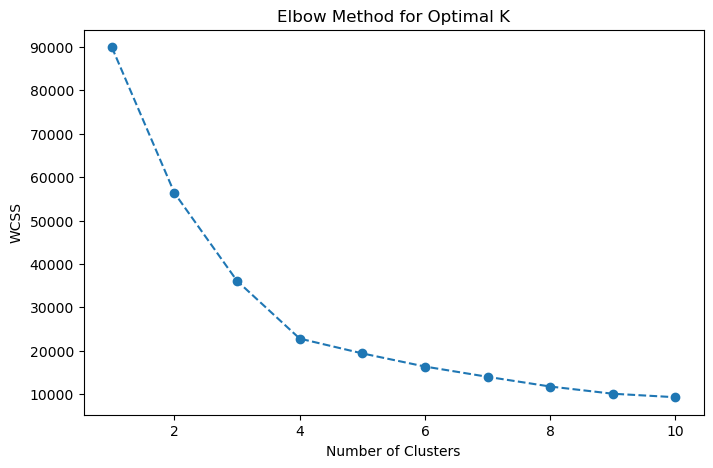

In [31]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
wcss = []  
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(scaled_cluster_df)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel("Number of Clusters")
plt.ylabel("WCSS")
plt.title("Elbow Method for Optimal K")
plt.show()

In [33]:
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
cluster_df['cluster'] = kmeans.fit_predict(scaled_cluster_df)

C:\Users\malli\AppData\Local\Temp\ipykernel_33600\445996449.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_df['cluster'] = kmeans.fit_predict(scaled_cluster_df)


In [36]:
cluster_df

,source_encoded,destination_encoded,cluster
39738,9011,832,2
28253,5156,12780,1
11077,541,5652,0
48505,5195,11247,1
16801,12696,6923,1
...,...,...,...
5252,4575,5867,0
12848,3021,7052,0
19105,2697,9072,0
34856,49,1072,0


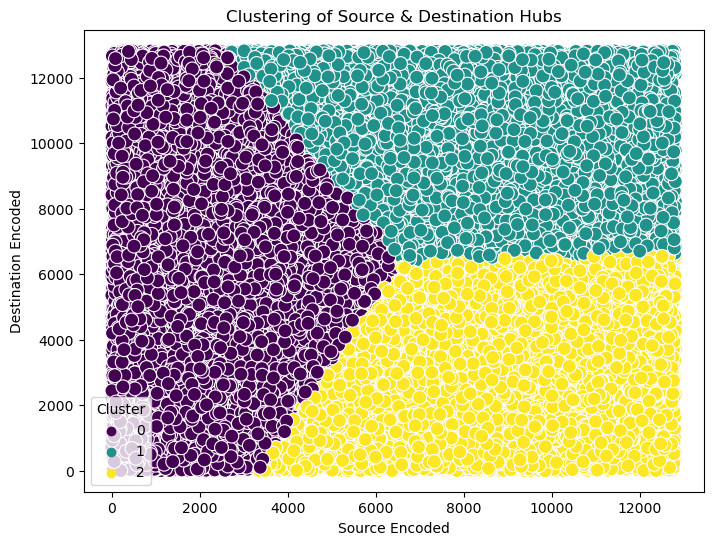

In [35]:
import seaborn as sns
plt.figure(figsize=(8, 6))
sns.scatterplot(x=cluster_df['source_encoded'], y=cluster_df['destination_encoded'], hue=cluster_df['cluster'], palette='viridis', s=100)
plt.xlabel("Source Encoded")
plt.ylabel("Destination Encoded")
plt.title("Clustering of Source & Destination Hubs")
plt.legend(title="Cluster")
plt.show()

### 13. Detect anomalies in ride pricing using **Isolation Forest or Z-score analysis**.

In [23]:
# using z-score
completed_rides.loc[:, 'Z_score'] = (completed_rides['total_fare'] - completed_rides['total_fare'].mean()) / completed_rides['total_fare'].std()

outliers = completed_rides[np.abs(completed_rides['Z_score']) > 3]
print(outliers)

Empty DataFrame
Columns: [services, date, time, ride_status, source, destination, duration, ride_id, distance, ride_charge, misc_charge, total_fare, payment_method, Z_score, Anomaly]
Index: []


C:\Users\malli\AppData\Local\Temp\ipykernel_1236\1270372904.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  completed_rides.loc[:, 'Z_score'] = (completed_rides['total_fare'] - completed_rides['total_fare'].mean()) / completed_rides['total_fare'].std()


In [28]:
# using isolation forest
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(contamination=0.02, random_state=42)

completed_rides['Anomaly'] = iso_forest.fit_predict(completed_rides['total_fare'].values.reshape(-1, 1))

anomalies = completed_rides[completed_rides['Anomaly'] == -1]
print(anomalies)

          services       date     time ride_status  ... total_fare payment_method   Z_score Anomaly
35796         bike 2024-01-07  24:25.7   completed  ...      69.94     Amazon Pay -1.735595      -1
13292         auto 2024-01-07  28:37.6   completed  ...    1020.63          Paytm  1.720268      -1
18986    bike lite 2024-01-07  41:51.7   completed  ...    1018.41        QR scan  1.712198      -1
34860  cab economy 2024-01-07  08:35.7   completed  ...      70.28           GPay -1.734359      -1
24688         bike 2024-01-07  17:36.7   completed  ...      71.20     Amazon Pay -1.731014      -1
...            ...        ...      ...         ...  ...        ...            ...       ...     ...
6929        parcel 2024-12-08  25:16.6   completed  ...      70.62          Paytm -1.733123      -1
27017  cab economy 2024-12-08  44:02.7   completed  ...      73.26           GPay -1.723526      -1
27200         bike 2024-12-08  41:54.7   completed  ...      66.27          Paytm -1.748936      -1


C:\Users\malli\AppData\Local\Temp\ipykernel_1236\2616954968.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  completed_rides['Anomaly'] = iso_forest.fit_predict(completed_rides['total_fare'].values.reshape(-1, 1))


In [33]:
anomalies.duplicated().sum()

0

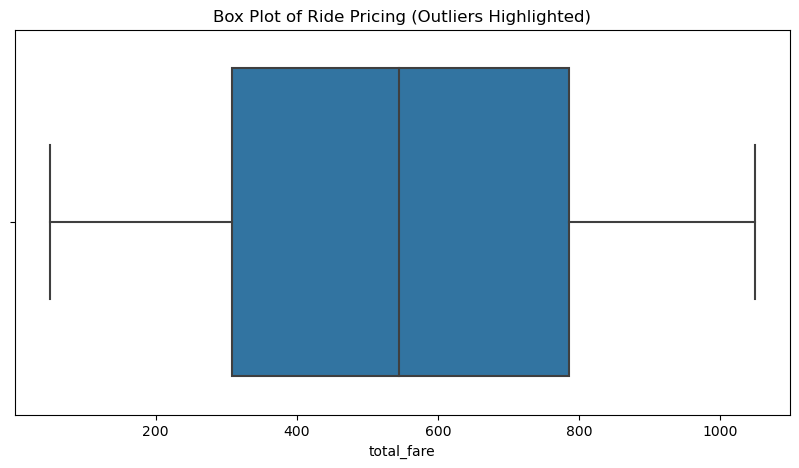

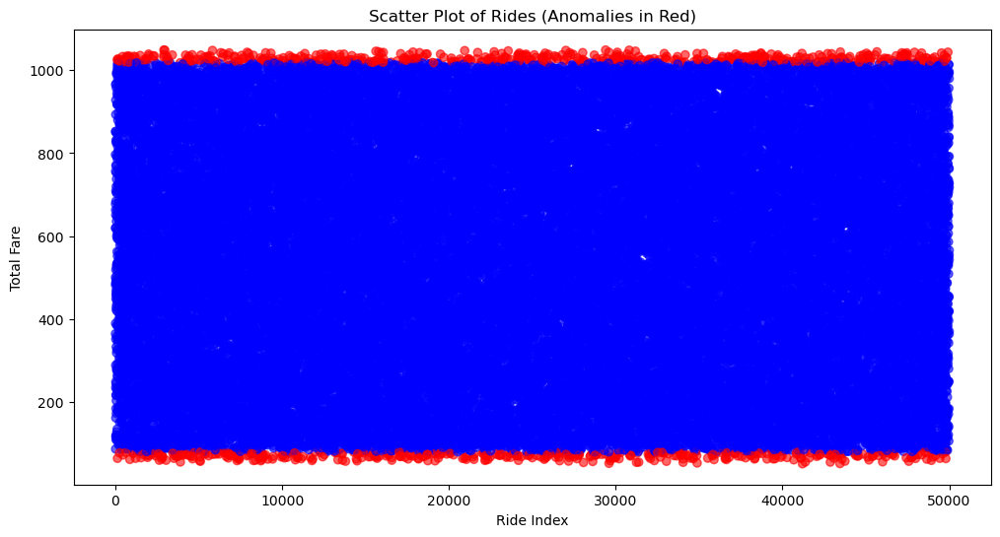

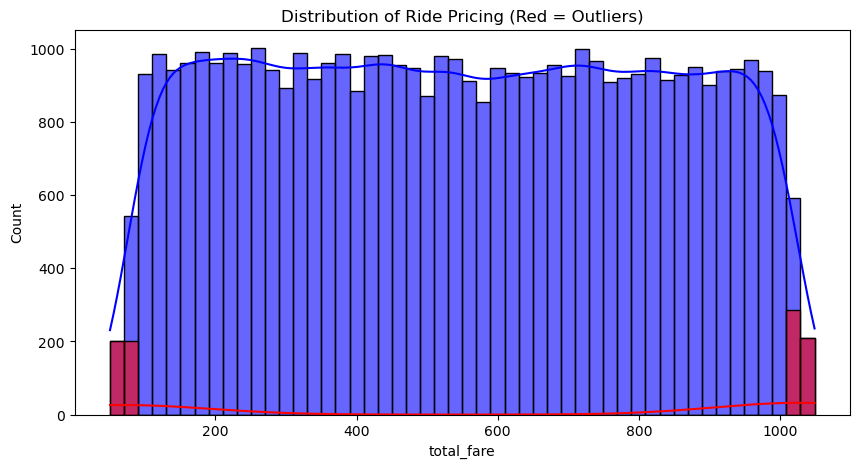

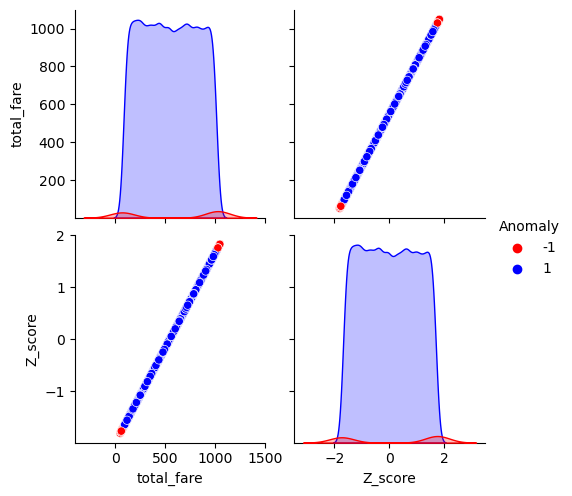

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define colors for anomalies
colors = completed_rides['Anomaly'].apply(lambda x: 'red' if x == -1 else 'blue')

##  1. Box Plot for total_fare 
plt.figure(figsize=(10, 5))
sns.boxplot(data=completed_rides, x='total_fare')
plt.title("Box Plot of Ride Pricing (Outliers Highlighted)")
plt.show()

##  2. Scatter Plot for Anomaly Detection 
plt.figure(figsize=(12, 6))
plt.scatter(completed_rides.index, completed_rides['total_fare'], c=colors, alpha=0.6)
plt.xlabel("Ride Index")
plt.ylabel("Total Fare")
plt.title("Scatter Plot of Rides (Anomalies in Red)")
plt.show()

##  3. Histogram with KDE 
plt.figure(figsize=(10, 5))
sns.histplot(completed_rides['total_fare'], bins=50, kde=True, color="blue", alpha=0.6)
sns.histplot(completed_rides[completed_rides['Anomaly'] == -1]['total_fare'], bins=50, kde=True, color="red", alpha=0.6)
plt.title("Distribution of Ride Pricing (Red = Outliers)")
plt.show()

##  4. Pair Plot to Check for Patterns 
sns.pairplot(completed_rides[['total_fare', 'Z_score', 'Anomaly']], hue='Anomaly', palette={-1: "red", 1: "blue"})
plt.show()


In [37]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

# Sample Data
df = completed_rides.copy()

# Convert Anomaly Column (-1 = Outlier, 1 = Normal)
df['Anomaly'] = df['Anomaly'].map({-1: 'Outlier', 1: 'Normal'})

##  1. Box Plot for Total Fare 
fig1 = px.box(df, y="total_fare", color="Anomaly",
              title="Box Plot of Ride Pricing (Outliers Highlighted)",
              points="all")  # Show all outliers
fig1.show()

##  2. Scatter Plot for Anomaly Detection 
fig2 = px.scatter(df, x=df.index, y="total_fare", color="Anomaly",
                  title="Scatter Plot of Ride Pricing Anomalies",
                  labels={'index': "Ride Index", 'total_fare': "Total Fare"})
fig2.show()

##  3. Histogram with KDE for Fare Distribution 
fig3 = px.histogram(df, x="total_fare", color="Anomaly", nbins=50,
                    marginal="box", opacity=0.7,
                    title="Distribution of Ride Pricing (Outliers in Red)")
fig3.show()

##  4. Parallel Coordinates Plot to Analyze Anomalies 
fig4 = px.parallel_coordinates(df, dimensions=['total_fare', 'Z_score'],
                               color=df['Anomaly'].apply(lambda x: 1 if x == 'Outlier' else 0),
                               color_continuous_scale='RdBu',
                               title="Parallel Coordinates Plot for Anomaly Analysis")
fig4.show()
